In [ ]:
from google.colab.patches import cv2_imshow
import cv2 as cv
import numpy as np
#Download sample video
!curl -o sample.mp4 https://www.bogotobogo.com/python/OpenCV_Python/images/mean_shift_tracking/slow_traffic_small.mp4
cap = cv.VideoCapture('sample.mp4')

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 1970k  100 1970k    0     0  3093k      0 --:--:-- --:--:-- --:--:-- 3093k


In [ ]:
# params for corner detection
feature_params = dict( maxCorners = 100,
                       qualityLevel = 0.3,
                       minDistance = 7,
                       blockSize = 7 )

In [ ]:

# Parameters for lucas kanade optical flow
lk_params = dict( winSize = (15, 15),
                  maxLevel = 2,
                  criteria = (cv.TERM_CRITERIA_EPS | cv.TERM_CRITERIA_COUNT,
                              10, 0.03))

In [ ]:
# Create some random colors
color = np.random.randint(0, 255, (100, 3))

In [ ]:
# Take first frame and find corners in it
ret, old_frame = cap.read()
old_gray = cv.cvtColor(old_frame,
                        cv.COLOR_BGR2GRAY)
p0 = cv.goodFeaturesToTrack(old_gray, mask = None,
                             **feature_params)
  

In [ ]:
# Create a mask image for drawing purposes
mask = np.zeros_like(old_frame)

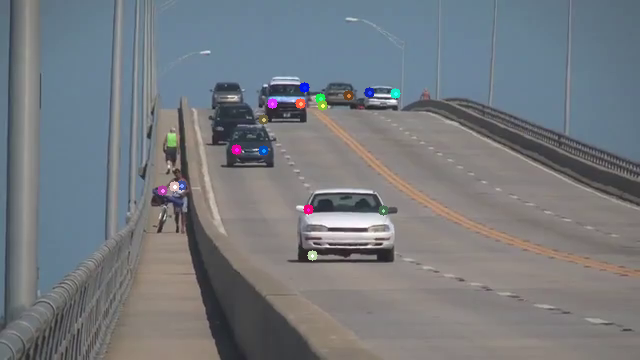

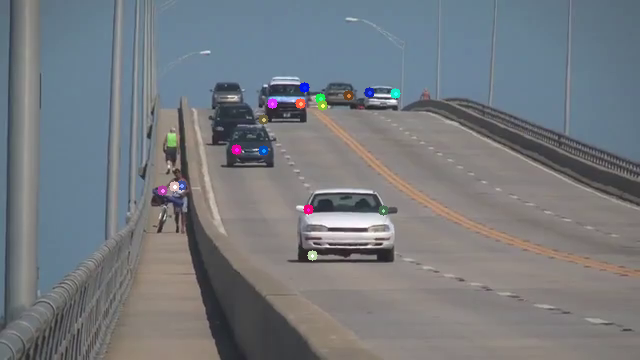

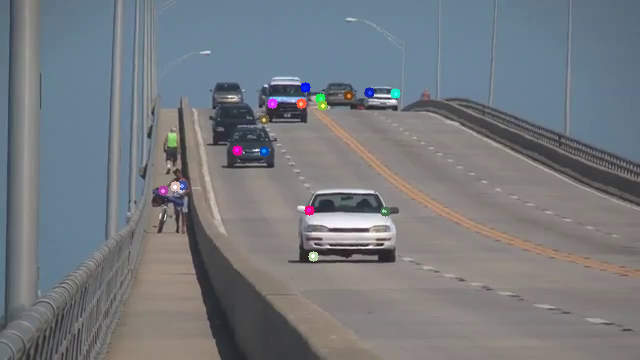

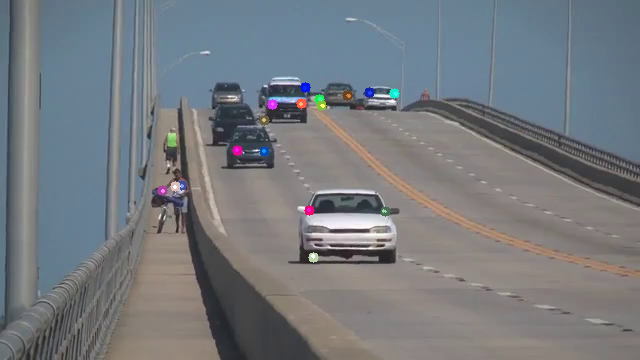

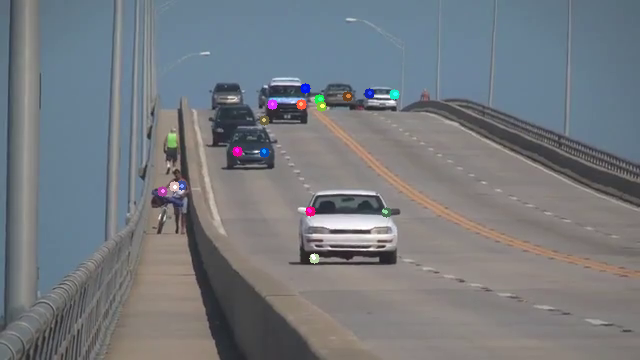

...

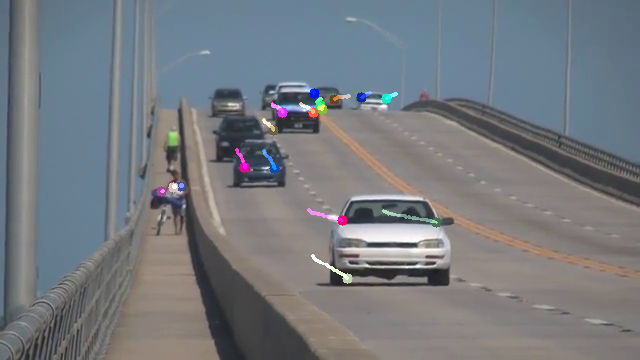

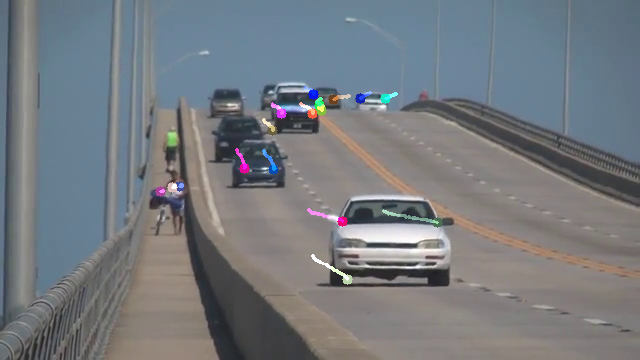

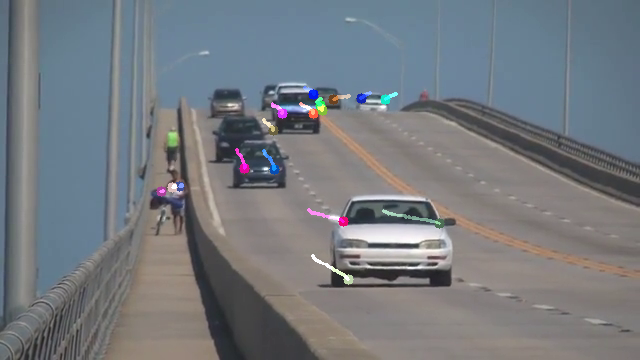

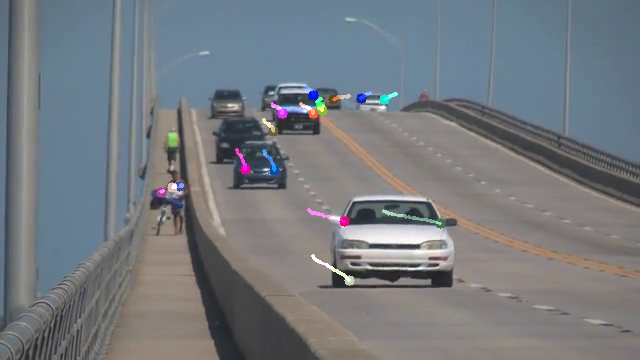

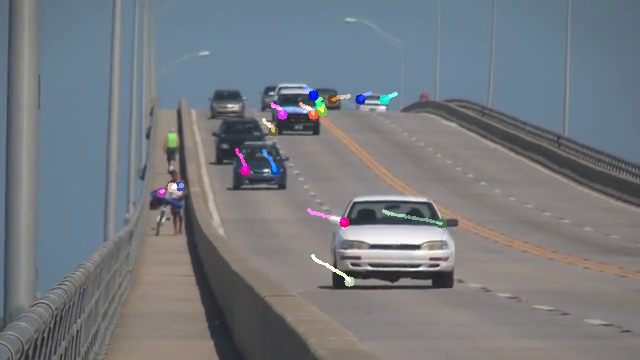

In [ ]:
while(1):
      
    ret, frame = cap.read()
    frame_gray = cv.cvtColor(frame,cv.COLOR_BGR2GRAY)
  
    # calculate optical flow
    p1, st, err = cv.calcOpticalFlowPyrLK(old_gray,
                                           frame_gray,
                                           p0, None,
                                           **lk_params)
  
    # Select good points
    good_new = p1[st == 1]
    good_old = p0[st == 1]
  
    # draw the tracks
    for i, (new, old) in enumerate(zip(good_new, 
                                       good_old)):
        a, b = new.ravel()
        c, d = old.ravel()
        mask = cv.line(mask, (a, b), (c, d),
                        color[i].tolist(), 2)
          
        frame = cv.circle(frame, (a, b), 5,
                           color[i].tolist(), -1)
          
    img = cv.add(frame, mask)
  
    cv2_imshow(img)
      
    k = cv.waitKey(25)
    if k == 27:
        break
  
    # Updating Previous frame and points 
    old_gray = frame_gray.copy()
    p0 = good_new.reshape(-1, 1, 2)
  
cv.destroyAllWindows()
cap.release()